<a href="https://colab.research.google.com/github/hoanbklucky/medgemma/blob/main/use_medgemma_4b_it_sft_lora_crc100k.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install -U transformers

## Local Inference on GPU
Model page: https://huggingface.co/hoanbklucky/medgemma-4b-it-sft-lora-crc100k

⚠️ If the generated code snippets do not work, please open an issue on either the [model repo](https://huggingface.co/hoanbklucky/medgemma-4b-it-sft-lora-crc100k)
			and/or on [huggingface.js](https://github.com/huggingface/huggingface.js/blob/main/packages/tasks/src/model-libraries-snippets.ts) 🙏

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [21]:
from transformers import pipeline
from PIL import Image
import requests
import torch

pipe = pipeline(
    "image-text-to-text",
    model="hoanbklucky/medgemma-4b-it-sft-lora-crc100k",
    torch_dtype=torch.bfloat16,
    device="cuda",
)





Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

Device set to use cuda


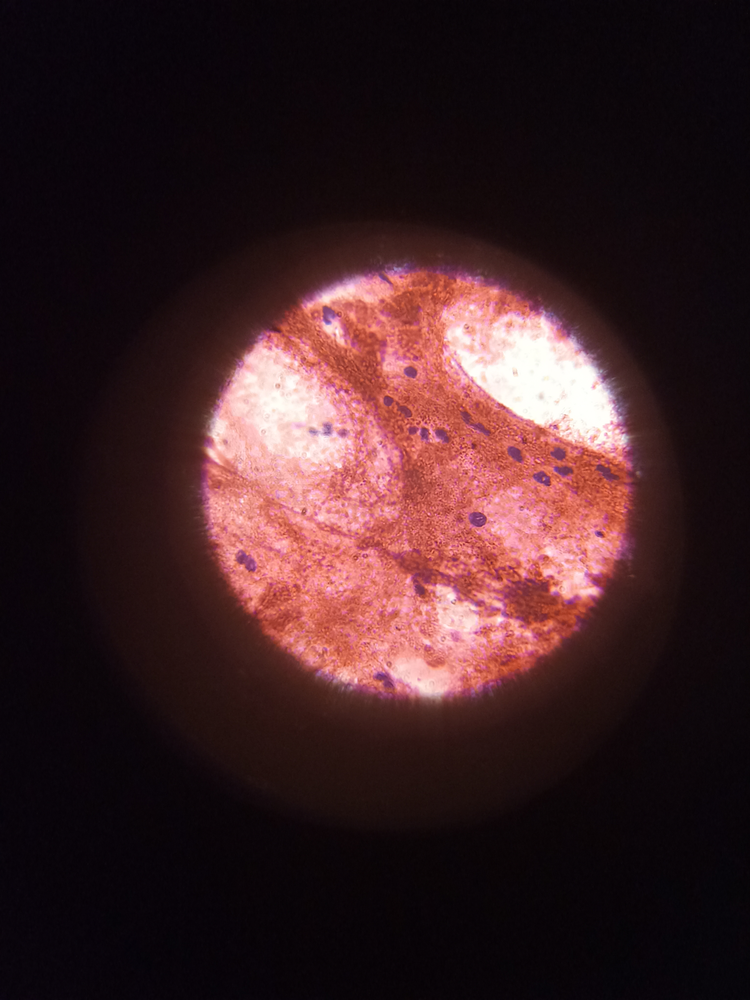

In [31]:
# prompt: display the image
# Image attribution: Stillwaterising, CC0, via Wikimedia Commons
image_path = "/content/drive/MyDrive/AI4Thyroid/Tanzania-Data/TAN063/IMG_230116124639202.jpg"
image = Image.open(image_path)
from IPython.display import display
display(image)

In [33]:
messages = [
    {
        "role": "system",
        "content": [{"type": "text", "text": "You are an expert pathologist."}]
    },
    {
        "role": "user",
        "content": [
            {"type": "text", "text": "What is the most likely tissue type shown in the histopathology image?\nbenign\nmalignant\nPrint out confidence score"},
            {"type": "image", "image": image}
        ]
    }
]

output = pipe(text=messages, max_new_tokens=200)
print(output[0]["generated_text"][-1]["content"])

Setting `pad_token_id` to `eos_token_id`:1 for open-end generation.


benign
